# Zadatak 1 (popravka kontrasta)

**Popravka kontrasta**, kao jedna od osnovnih tehnika za obradu slike, podrazumeva poboljšanje osvetljenja slike. Ovom metodom želimo da postignemo da se detalji i najbitniji segmenti slike istaknu, a ovo postižemo korišćenjem celog opsega intenziteta osvetljenja koji nam je na raspolaganju. U slučaju slike koja nam je data u ovom zadatku (*street.tif*), koja se čuva u 16-bitnom formatu, to znači da se vrednosti intenziteta slike kreću u opsegu od 0 do 65535 (2^16-1).

In [1]:
# Import-ovanje potrebnih biblioteka
from pylab import *
import numpy as np
import matplotlib.pyplot as plt
import os

import skimage
from skimage import color
from skimage import exposure
from skimage import filters
from skimage import io
from skimage import util

ImageProperties:
   type:    <class 'numpy.ndarray'>
   element type:    <class 'numpy.uint16'>
   size:    23970816
   shape:    (2448, 3264, 3)
   min:    0
   max:    15167
   mean:    2916.807922475397


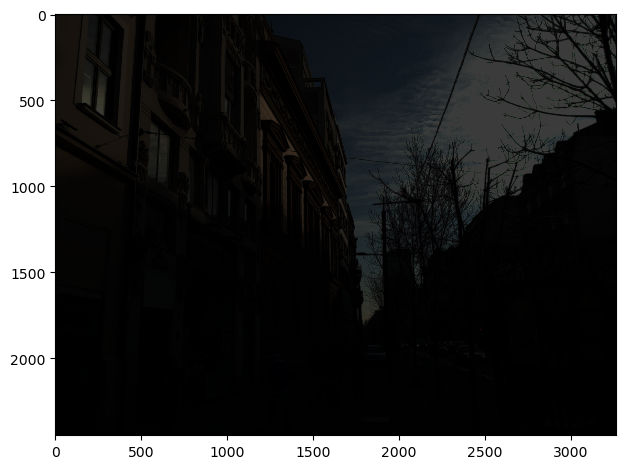

In [2]:
# Ucitavanje slike 'street.tif' i prikazivanje podataka o njoj
data_dir = '../sekvence'
image_path = os.path.join(data_dir, 'street.tif')
img = io.imread(image_path)

# Ulaz fje mora biti slika sa 3 kanala za boje
def printImageProperties(image):
    '''
    Prikazuje osnovne informacije o slici.
    
    Ulazi:
    - image (numpy.ndarray): Numpy 3D niz koji predstavlja sliku u boji
    
    Izlazi: None
    '''
    print('ImageProperties:')
    print('   type:   ', type(image))
    print('   element type:   ', type(image[0,0,0]))
    print('   size:   ', image.size)
    print('   shape:   ', image.shape)
    print('   min:   ', image.min())
    print('   max:   ', image.max())
    print('   mean:   ', image.mean())
    
def print2DImageProperties(image):
    '''
    Prikazuje osnovne informacije o slici.
    
    Ulazi:
    - image (numpy.ndarray): Numpy 2D niz koji predstavlja sivu sliku
    
    Izlazi: None
    '''
    print('ImageProperties:')
    print('   type:   ', type(image))
    print('   element type:   ', type(image[0,0]))
    print('   size:   ', image.size)
    print('   shape:   ', image.shape)
    print('   min:   ', image.min())
    print('   max:   ', image.max())
    print('   mean:   ', image.mean())
    
printImageProperties(img)
io.imshow(util.img_as_float(img))

**Zaključci o slici** 

Dimenzije naše slike su 2448 x 3264. Srednja vrednost intenziteta slike je oko 3000 na opsegu od 0 do 65535. To i činjenica da je maksimalna vrednost intenziteta 15167 nam ukazuje da se radi o izuzetno tamnoj slici. Da bismo popravili sliku, primenićemo nekoliko metoda nad njom, ali pre toga ćemo analizirati njen histogram. Analiziranjem histograma možemo dobiti još informacija o slici pre nego što je transformišemo.

## 1.1. Analiza histograma slike

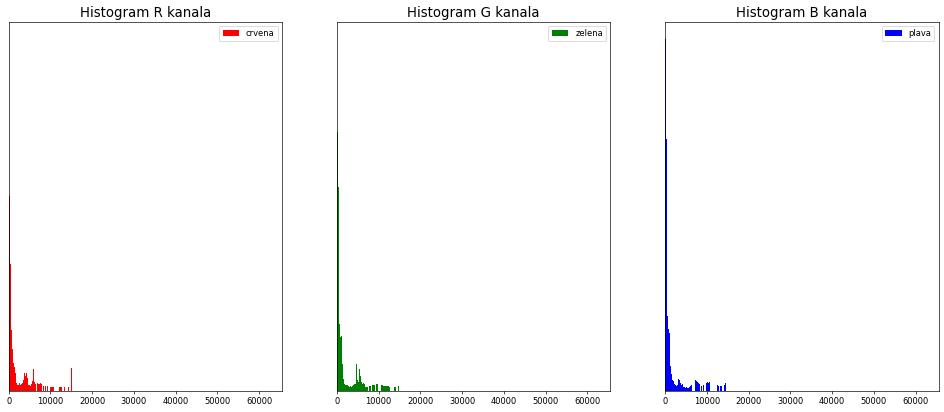

In [3]:
def show_histograms_by_color_channel(image):
    '''
    Prikazuje histograme ulazne slike po svakom kanalu za boju
    
    Ulazi:
    - image (numpy.ndarray): 3D numpy niz koji predstavlja sliku u boji
    
    Izlazi: None
    '''
    
    # izdvajanje kanala po bojama
    image_r = image[:,:,0]
    image_g = image[:,:,1]
    image_b = image[:,:,2]
    
    fig, axes = plt.subplots(1,3, figsize=(20,8), dpi=60)

    x_values = [0, 63, 127, 192, 255]
    axes[0].hist(image_r.flatten(), bins=255, color='r', label = 'crvena'); 
    axes[0].set_title('Histogram R kanala', fontsize=16)
    axes[0].legend()
    axes[0].get_yaxis().set_visible(False)
    axes[0].set_xlim([0, 65535])

    axes[1].hist(image_g.flatten(), bins=256, color='g', label = 'zelena'); 
    axes[1].set_title('Histogram G kanala', fontsize=16)
    axes[1].legend()
    axes[1].get_yaxis().set_visible(False)
    axes[1].set_xlim([0, 65535])

    axes[2].hist(image_b.flatten(), bins=256, color='b', label = 'plava'); 
    axes[2].set_title('Histogram B kanala', fontsize=16)
    axes[2].legend()
    axes[2].get_yaxis().set_visible(False)
    axes[2].set_xlim([0, 65535])
    
show_histograms_by_color_channel(img)

Komentarisati kako je  ocekivano da imamo piksele po svim intenzitetima, jer je ipak HDR slika
Zakljucujemo da ne mozemo primeniti metode razvlacenja kontrasta, jer nam histogram nije lokalizovanog opsega intenziteta

Kao što je očekivano, sve vrednosti intenziteta piksela se nalaze levo od 15167. Metode popravke kontrasta koje ćemo primeniti na slici su sledeće:
- Razvlačenje kontrasta
- Primena log funkcije
- Primena stepene (korene) funkcije
- Ekvalizacija histograma
- Adaptivna ekvalizacija histograma sa ograničenjem kontrasta
    - samo nad sivom slikom
    - nad sve tri komponente boje


## 1.2. Razvlacenje kontrasta

Ova metoda poprave kontrasta podrazumeva primenu deo po deo linearne transformacione funkcije T(r) na svaki piksel na slici. Pošto znamo da se svi intenziteti nalaze u krajnjem levom delu histograma, biramo transformacionu funkciju T(r) tako da preslika opseg (0, 15167) u opseg (0, 65535). 

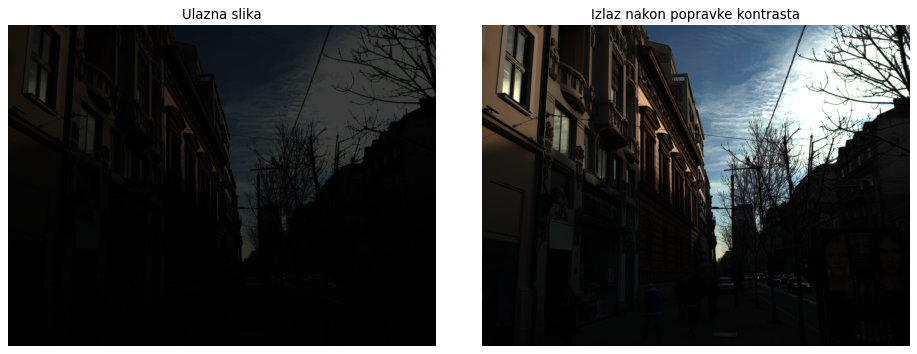

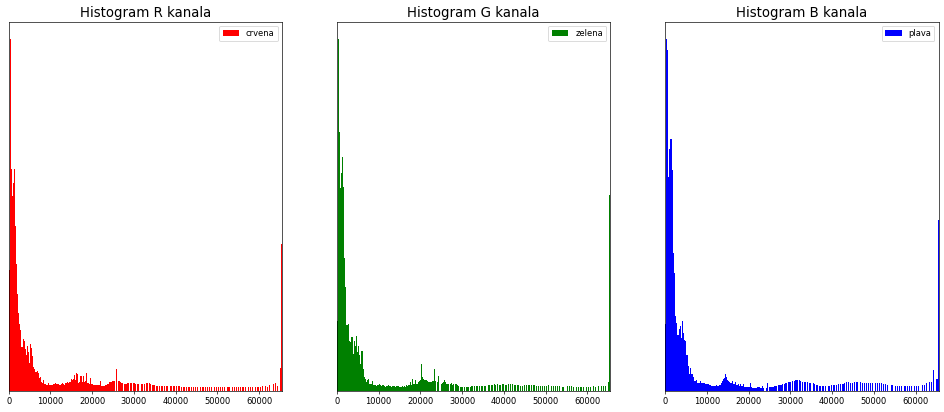

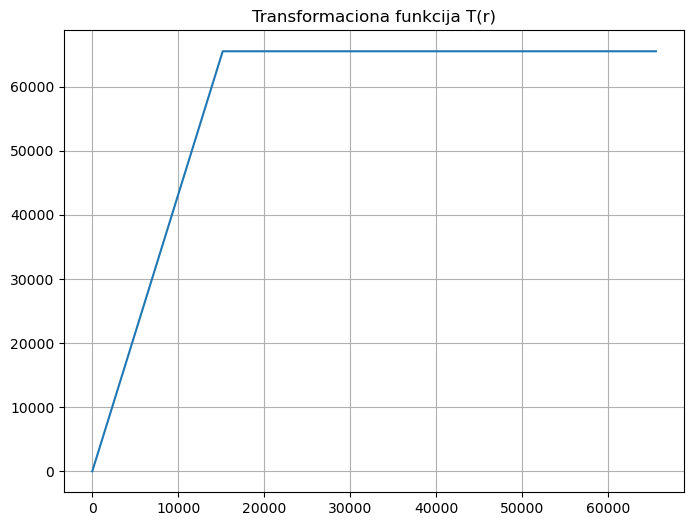

In [4]:
# Popravka kontrasta razvlacenjem histograma

# Parametri izabrani za idealan oblik T(r) fje
a = 0
b = 15167
val_a = 0
val_b = 65535

x_val = [0, a, b, 65535]
y_val = [0, val_a, val_b, 65535]

img_out_hist_stretch = uint16(np.interp(double(img), x_val, y_val))

# Prikaz ulazne i izlazne slike
fig, ax = plt.subplots(ncols=2, figsize=(12,6), dpi=80)
plt.tight_layout()

ax[0].imshow(util.img_as_float(img)); ax[0].set_title('Ulazna slika'); ax[0].axis('off')
ax[1].imshow(util.img_as_float(img_out_hist_stretch)); ax[1].set_title('Izlaz nakon popravke kontrasta'); ax[1].axis('off');

# Prikaz histograma nakon razvlacenja
show_histograms_by_color_channel(img_out_hist_stretch)

# Prikaz fje T(r)
fig = plt.figure(figsize=(8,6))
plt.plot(x_val, y_val)
plt.title('Transformaciona funkcija T(r)')
plt.grid(visible=True)
plt.show()

**Rezultati metode**
Funkcija T(r) je uspešno razvukla histogram, međutim, slika je opet tamna, zato što i nakon transformacije se većina piksela nalazi u levoj polovini histograma (videti poslednje histograme). Uspešna popravka kontrasta bi se dobila ako bismo nad ovom izlaznom slikom ponovo upotrebili ovakvu, sličnu, transformacionu funkciju. 
Više uzastopnih transformacija nad ulaznom slikom nisu dobro rešenje i zato se ovom metodom ne može na optimalan način popraviti kontrast ulazne slike.

## 1.3. Kompresija kontrasta log  fjom

Problem sa prethodnom metodom je bilo što smo morali da primenimo više uzastopnih transformacija nad slikom da bismo dobili dobar rezultat. U ovakvim situacijama, kada nam je slika izuzetno tamna, bolja metoda za popravku kontrasta je da nam transformaciona funkcija T(r) bude logaritamska funkcija sa realnim parametrom c:

$T(r) = \frac{log(1 + 10^c \cdot r)}{log(1 + 10^c)}$ 

**Odabir parametra c**
Testiranjem ove transformacije pomoću interact-a u notebooku-u, odabrao sam parametar c = 2.2 kao odličan primer za popravku kontrasta slike. Povećanjem parametra c, naša transformaciona funkcija bi bila previše strma u početku. To bi učinilo našu izlaznu sliku previše svetlu i pojačalo bi šum. Smanjenjem parametra c, slika ne bi imala dovoljno dobro popravljen kontrast i ostala bi previše tamna. Opseg vrednosti koji daje solidne rezultate za parametar c je (2.0, 2.4), a odabrana vrednost, po mom mišljenju, daje najlepšu sliku vizuelno. 

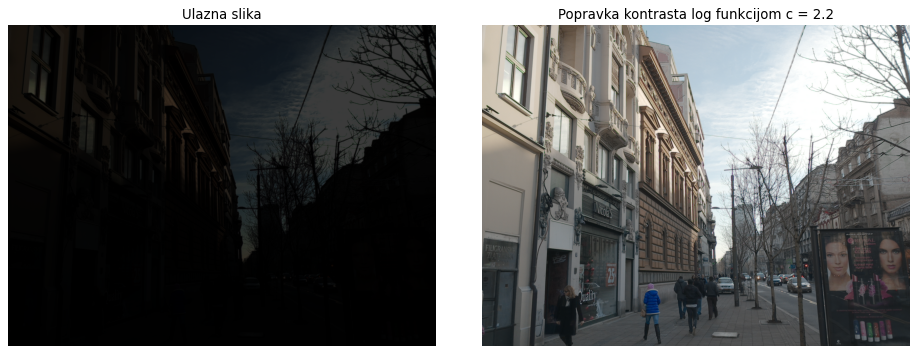

In [5]:
f = img
f = f/max(f.flatten())

# Odabir parametra 
c = 2.2
img_out_log = log(1 + (10**c)*f)/log(1+10**c)

# Prikaz rezultata
fig, ax = plt.subplots(ncols=2, figsize=(12,6), dpi=80)
plt.tight_layout()

ax[0].imshow(util.img_as_float(img)); ax[0].set_title('Ulazna slika'); ax[0].axis('off')
ax[1].imshow(util.img_as_float(img_out_log)); ax[1].set_title('Popravka kontrasta log funkcijom c = 2.2'); ax[1].axis('off');


Ova metoda je popravila problem prethodne time što smo u jednoj transformaciji T(r) postigli dobre rezultate izlazne slike. Osim ove metode, vrlo slična metoda je da se umesto logaritamske funkcije koristi korena funkcija. 

## 1.4. Primena stepene (korene) funkcije

Transformaciona funkcija u obliku stepene funkcije:

$T(r) = r^c$ 

Isto kao prethodna metoda, postoji parametar c koji možemo varirati. Prednost ove metode od log funkcije jeste što se ova metoda može primeniti i na smanjenje osvetljenosti slike, ne samo na povećanje osvetljenosti. Ako bismo parametar c izabrali da bude veći od 1, slika bi postala tamnija, a u suprotnom posvetljujemo sliku.

**Odabir parametra c**
Korišćenjem interact ćelije, odokativno sam odabrao parametar c = 0.36. Jedino predznanje koje smo mogli da očekujemo o izboru parametra je da će parametar biti manji od 1. Variranjem njegove vrednosti, zaključio sam da je potrebna vrednost za našu konkretnu sliku između 0.3 i 0.4. Ukoliko bismo izabrali manji parametar c, slika bi imala previše pojačan šum, dok veći parametar od 0.4 ne bi dovoljno popravio kontrast.


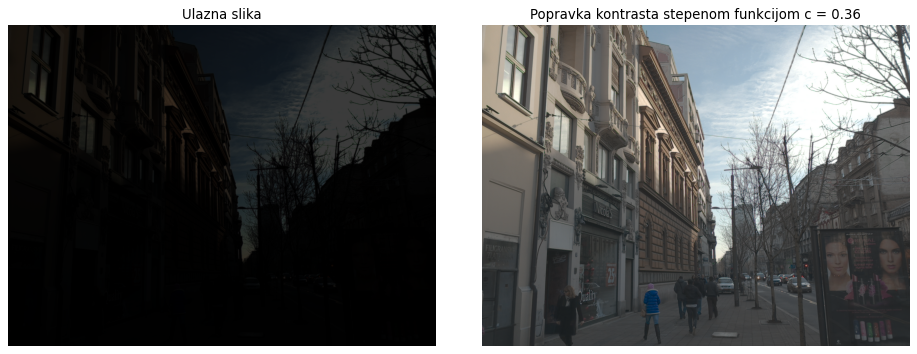

In [6]:
f = img
f = f/max(f.flatten())

# Odabir parametra
c=0.36
img_out_gamma = f**c

# Prikaz rezultata
fig, ax = plt.subplots(ncols=2, figsize=(12,6), dpi=80)
plt.tight_layout()

ax[0].imshow(util.img_as_float(img)); ax[0].set_title('Ulazna slika'); ax[0].axis('off')
ax[1].imshow(util.img_as_float(img_out_gamma)); ax[1].set_title('Popravka kontrasta stepenom funkcijom c = 0.36'); ax[1].axis('off');

**Rezultat metode** Po kvalitetu, slika je u istom rangu kao rezultat popravke sa log funkcijom. Ipak su vrlo slične transformacije.

## 1.5. Ekvalizacija histograma (HE)

**Ekvalizacija histograma** je najčešće primenjivana metoda nad HDR slikama. Metoda podrazumeva da se primeni takva transformacija T(r) nad pikselima, takva da izlazna slika ima uniforman histogram. S obzirom da naša slika ima puno detalja i širokog dinamičkog opsega je, ova metoda bi trebalo da da bolje rezultate od prethodnih. Primenimo ovu metodu na našu sliku, a predstavićemo i histograme nakon primene HE.

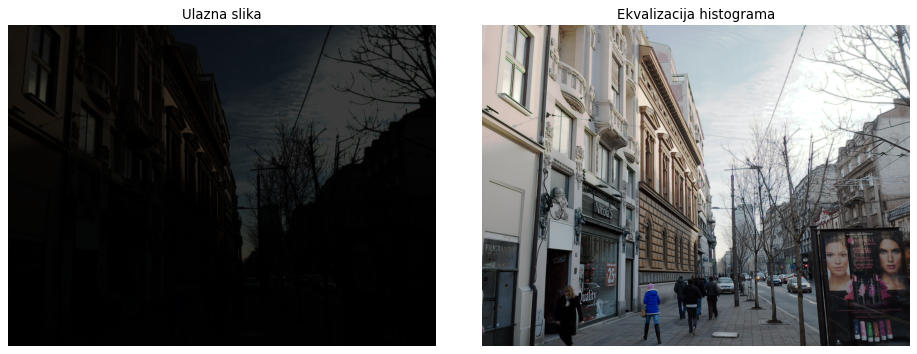

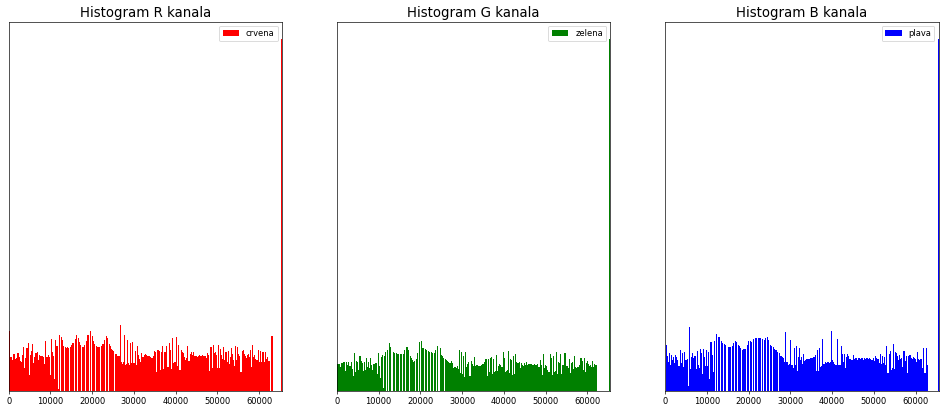

In [7]:
# Svaki kanal slike ekvaliziramo posebno i onda ih spajamo u jednu sliku
img_he_r = util.img_as_uint(exposure.equalize_hist(img[:,:,0],nbins=65536))
img_he_g = util.img_as_uint(exposure.equalize_hist(img[:,:,1],nbins=65536))
img_he_b = util.img_as_uint(exposure.equalize_hist(img[:,:,2],nbins=65536))

# equalize_hist fja vraca niz float-ova, pa je potrebno img_as_uint za transf

# Spajanje kanala slike
img_he = img.copy()
img_he[:,:,0]=img_he_r
img_he[:,:,1]=img_he_g
img_he[:,:,2]=img_he_b

# Prikaz rezultata
fig, ax = plt.subplots(ncols=2, figsize=(12,6), dpi=80)
plt.tight_layout()

ax[0].imshow(util.img_as_float(img)); ax[0].set_title('Ulazna slika'); ax[0].axis('off')
ax[1].imshow(util.img_as_float(img_he)); ax[1].set_title('Ekvalizacija histograma'); ax[1].axis('off');

# Prikaz histograma nakon HE
show_histograms_by_color_channel(img_he)

Kao što vidimo, izlazna slika ima približno uniformne histograme po kanalima za boje. Teško je postići skroz uniforman histogram, zato što su u pitanju pikseli koji imaju diskretizovane vrednosti za intenzitet. Ipak, ova metoda je dala odlične rezultate i mnogo se bolje vide detalji nakon HE metode nego npr. nakon  primene stepene transformacione funkcije. 

HE metoda ima jedan problem, koji možemo uočiti u histogramima. U opsegu intenziteta od oko 10000 do 30000 možemo primetiti da puno intenziteta nema ni jedan piksel sa tom vrednošću intenziteta. To su zapravo ovi razmaci između bin-ova. Da bismo obezbedili veće iskorišćenje opsega intenziteta, trebalo bi i u te bin-ove ubaciti neke piksele. Tako bismo dobili idealan kontrast na slici. 

Osim problema praznih bin-ova, iz originalne slike možemo primetiti da neki delovi slike su svetliji nego drugi (nebo je najsvetliji deo). Samim tim, nije adekvatno da primenimo istu transformaciju nad svim pikselima u slici. Naša izlazna slika nakon HE metode ima previše svetlo nebo i fasadu zgrada. Ove probleme HE metode rešava sledeća metoda.

## 1.6. Adaptivna ekvalizacija histograma sa ogranicenjem kontrasta (CLAHE)

Ova metoda predstavlja nadogradnju ekvalizacije histograma. Ideja je da se slika podeli u regione nad kojima se primenjuju različite transformacione funkcije. Time će svaki region slike imati izjednačen histogram. Osim toga, ograničenje kontrasta u metodi predstavlja rešenje problema praznih bin-ova. Klipovanjem histograma na mestima gde ima puno intenziteta i deljenjem tog klipovanog dela ostatku histograma će dodatno poboljšati kontrast. 

Metodu ćemo primeniti na dva načina. Prvo ćemo izdvojiti samo sivu sliku (Y komponentu iz slike u YUV kolor sistemu) i nad njom uraditi CLAHE. Tako ekvalizovanu sivu sliku zatim spajamo sa neizmenjenim komponentama za boju. Drugi način je da izvršimo CLAHE metodu na sve tri komponente boje.

**Odabir parametara**
Ova metoda ima 3 parametara:
- broj regiona po x osi slike
- broj regiona po y osi slike
- Cliplimit

Metoda CLAHE ima bolje rezultate što više regiona slike imamo. Prema tome, izabraćemo što više regiona. Što je ClipLimit manji, to je histogram po regionu slike više uniforman, tj. manje se dopušta razlika u broju piksela po bin-u na histogramu. Uzećemo malu vrednost za ovaj parametar, tj. Cliplimit=0.01. Kada bismo uzeli veću vrednost od ove, naši prazni bin-ovi iz prethodne metode bi imali vrlo malo vrednosti, pa se CLAHE metoda ne bi ponašala mnogo bolje nego HE.

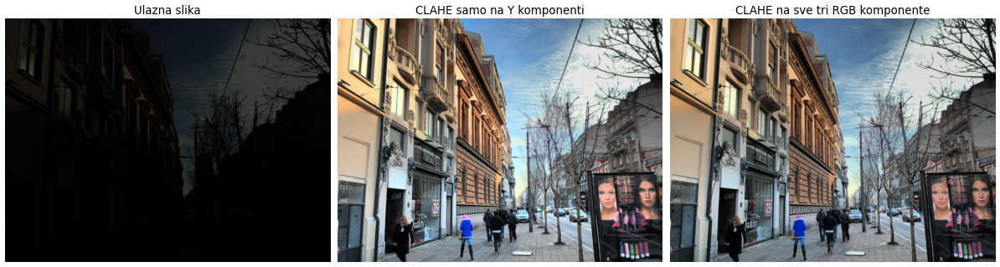

In [8]:
# Ponovno ucitavanje slike 
data_dir = '../sekvence'
image_path = os.path.join(data_dir, 'street.tif')
img = io.imread(image_path)
img = util.img_as_float(img)

[height, width, planes] = shape(img)

# RGB -> YUV
# izdvajanje sive slike
img_yuv = color.rgb2yuv(img)
y_in = img_yuv[:,:,0]

# Variranje parametara za velicinu regiona i clip_limit
y_out = exposure.equalize_adapthist(y_in, [height/2, width/2], clip_limit=0.01, nbins=65536)

# Vracanje sive slike nazad
img_out_y_eq = img.copy()
img_out_y_eq[:,:,0] = img_out_y_eq[:,:,0]*(y_out/(y_in+1e-6))
img_out_y_eq[:,:,1] = img_out_y_eq[:,:,1]*(y_out/(y_in+1e-6))
img_out_y_eq[:,:,2] = img_out_y_eq[:,:,2]*(y_out/(y_in+1e-6));
img_out_y_eq = np.clip(img_out_y_eq, 0, 1)

# Variranje parametara za velicinu regiona i clip_limit
img_out_rgb_eq = exposure.equalize_adapthist(img, [height/2, width/2], clip_limit=0.01, nbins=65536)

# Prikaz rezultata
fig, axes = plt.subplots(nrows=1, ncols=3,  figsize=(20,8), dpi=60)
ax = axes.ravel()

ax[0].imshow(img); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika', fontsize=16)
ax[1].imshow(img_out_y_eq); ax[1].set_axis_off(); ax[1].set_title('CLAHE samo na Y komponenti', fontsize=16)
ax[2].imshow(img_out_rgb_eq); ax[2].set_axis_off(); ax[2].set_title('CLAHE na sve tri RGB komponente', fontsize=16)

plt.tight_layout()

## 1.7. Zakljucak 

Uporedimo sada sve metode. Prikazaćemo sve slike na jednom mestu.

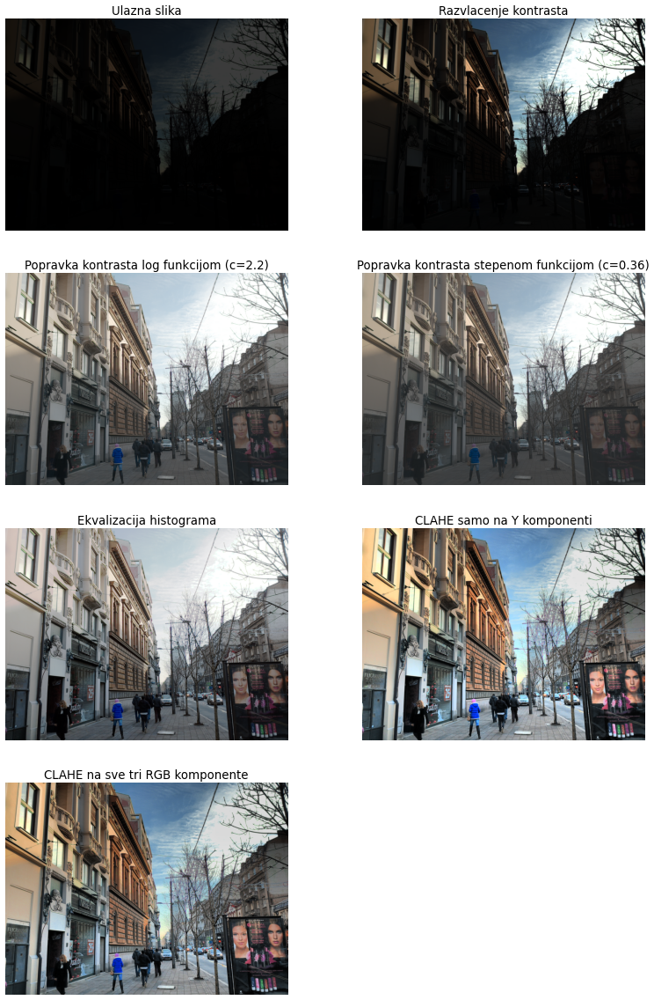

In [9]:
# Poredjenje svih metoda koriscenjih za popravku kontrasta
fig, ax = plt.subplots(nrows=4, ncols=2,  figsize=(16,24), dpi=60)

# Originalna slika
ax[0,0].imshow(img); 
ax[0,0].set_axis_off(); 
ax[0,0].set_title('Ulazna slika', fontsize=16)

# Razvlacenje kontrasta
ax[0,1].imshow(util.img_as_float(img_out_hist_stretch)); 
ax[0,1].set_axis_off(); 
ax[0,1].set_title('Razvlacenje kontrasta', fontsize=16)

# Log fja
ax[1,0].imshow(img_out_log); 
ax[1,0].set_axis_off(); 
ax[1,0].set_title('Popravka kontrasta log funkcijom (c=2.2)', fontsize=16)

# Stepena fja
ax[1,1].imshow(img_out_gamma); 
ax[1,1].set_axis_off(); 
ax[1,1].set_title('Popravka kontrasta stepenom funkcijom (c=0.36)', fontsize=16)

# Metoda HE
ax[2,0].imshow(util.img_as_float(img_he)); 
ax[2,0].set_axis_off(); 
ax[2,0].set_title('Ekvalizacija histograma', fontsize=16)

# Metoda CLAHE na sivoj slici
ax[2,1].imshow(img_out_y_eq); 
ax[2,1].set_axis_off(); 
ax[2,1].set_title('CLAHE samo na Y komponenti', fontsize=16)

# Metoda CLAHE na sve tri komponente
ax[3,0].imshow(img_out_rgb_eq); 
ax[3,0].set_axis_off(); 
ax[3,0].set_title('CLAHE na sve tri RGB komponente', fontsize=16)

fig.delaxes(ax[3,1])

Komentarisali smo sve slike do sada, osim poslednje dve. Vrlo su sličnog kvaliteta, što nam ukazuje da je dovoljna jedna primena CLAHE metode nad sivom slikom, nego triput nad svakom komponentom. To je velika ušteda u računarskom opterećenju, samim tim bih rekao da je pretposlednji rezultat najbolji rezultat popravke kontrasta (dobili smo iste rezultate sa tri puta manje zahtevnom metodom). 

Svakako je **CLAHE metoda** bila najbolja za popravku kontrasta, a pošto su obe realizacije te metode vrlo sličnog rezultata, možemo da izaberemo bilo koju od te dve kao konačni rezultat koji ćemo sačuvati. Neka to bude realizacija samo nad Y komponentom. Tek u ovom koraku transformišemo sliku u **format uint8**

In [10]:
# Biramo koju sliku zelimo da sacuvamo 
# Smestamo je u img_out, tu sliku zatim cuvamo kao 'street_out.jpg'
img_out = util.img_as_ubyte(img_out_y_eq) # Konverzija u tip uint8

output_image_path = os.path.join(data_dir, 'street_out.jpg')
io.imsave(output_image_path, img_out)

# Zadatak 2 (Izostravanje ivica slike)

**Izoštravanje slike** podrazumeva isticanjem svih ivica u njoj. Ivice kao deo slike su prostorno obeležje slike, jer nisu opisana na nivou piksela, već su definisana u zavisnosti od vrednosti susednih piksela. Dakle ova metoda je prostorna operacija nad slikom.

Izoštravanje možemo postići na više načina:
- Lagranžijanom
- isticanjem visokih učestanosti

Obe metode ćemo primeniti. Pre toga ćemo da učitamo našu sliku koju treba da učitamo i da prikažemo njene osobine.

In [11]:
# Importovanje biblioteka
from pylab import *

import skimage
from skimage import color
from skimage import exposure
from skimage import filters
from skimage import io
from skimage import util

from scipy import ndimage

import numpy as np

ImageProperties:
   type:    <class 'numpy.ndarray'>
   element type:    <class 'numpy.float64'>
   size:    2865600
   shape:    (1200, 796, 3)
   min:    0.0
   max:    1.0
   mean:    0.18757681654459654


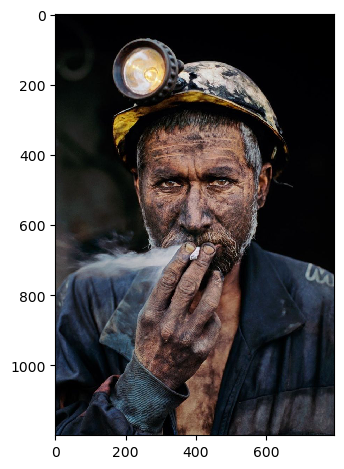

In [12]:
# Ucitavanje i prikaz slike sa njenim informacijama

data_dir = '../sekvence'
image_path = os.path.join(data_dir, 'miner.jpg')
img = util.img_as_float(io.imread(image_path))
printImageProperties(img)
io.imshow(img)

## 2.1. Primena laplasijana

Izoštravanje primenom laplasijana predstavlja upotrebu posebnih prostornih maski nad slikom. Ove maske se mogu analitički dobiti na osnovu drugih izvoda, a one koje ćemo mi koristiti su sledeće:
- prva maska:  
\begin{matrix}
0 & 1 & 0\\
1 & -4 & 1\\
0 & 1 & 0
\end{matrix}

- druga maska:  
\begin{matrix}
1 & 1 & 1\\
1 & -8 & 1\\
1 & 1 & 1
\end{matrix}

- treća maska:  
\begin{matrix}
-1 & 2 & -1\\
2 & -4 & 2\\
-1 & 2 & -1
\end{matrix}

- četvrta maska:  
\begin{matrix}
0 & 0 & 1 & 0 & 0\\
0 & 1 & 2 & 1 & 0\\
1 & 2 & -16 & 2 & 1\\
0 & 1 & 2 & 1 & 0\\
0 & 0 & 1 & 0 & 0
\end{matrix}

- peta maska:  
\begin{matrix}
0 & 0.0625 & 0\\
0.0625 & -0.25 & 0.0625\\
0 & 0.0625 & 0
\end{matrix}

Ove maske, kao i primeri još par maski se mogu naći i na sledećem linku:
https://jblindsay.github.io/ghrg/Whitebox/Help/FilterLaplacian.html

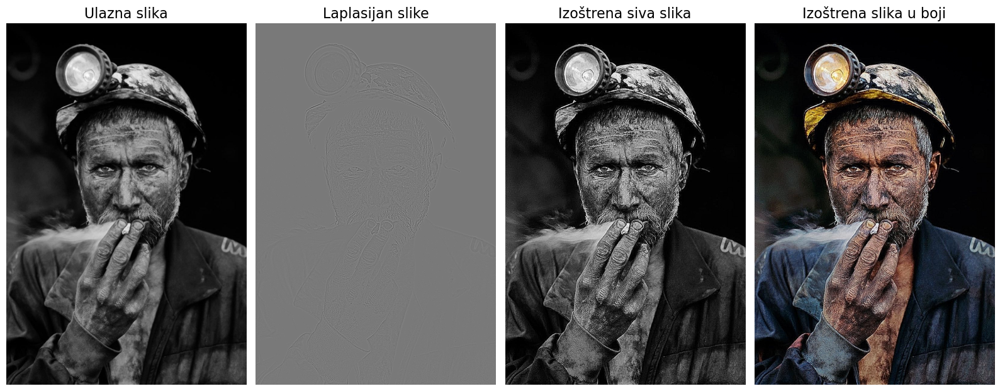

In [13]:
# Odabir laplasijan maske
# laplacian_mask = np.array([ [0,  1, 0],
#                             [1, -4, 1],
#                             [0,  1, 0] ])
laplacian_mask = np.array([ [1,  1, 1],
                            [1, -8, 1],
                            [1,  1, 1] ])
# laplacian_mask = np.array([ [-1, 2, -1],
#                             [2, -4, 2],
#                             [-1,  2, -1] ]) 

# laplacian_mask = np.array([ [0,  0, 1, 0, 0],
#                             [0, 1, 2, 1, 0],
#                             [1, 2, -16, 2, 1],
#                             [0, 1, 2, 1, 0],
#                             [0,  0, 1, 0, 0]])
# laplacian_mask = np.array([ [0,  0.0625, 0],
#                             [0.0625, -0.25, 0.0625],
#                             [0,  0.0625, 0] ]) 

# Konverzija u YUV kolor sistem
img_yuv = color.rgb2yuv(img)

# Korelaciju vrsimo samo nad Y komponentom slike
img_y = img_yuv[:,:,0]
img_y_lap = ndimage.correlate(img_y, laplacian_mask) # VF filtirana slika 
img_y_sharp = img_y - img_y_lap # Znak minus kada je centralni elem. negativan

img_y_sharp = np.clip(img_y_sharp, 0, 1)

img_yuv_out = np.zeros(shape=shape(img_yuv), dtype=float64)
img_yuv_out[:,:,1:3] = img_yuv[:,:,1:3]
img_yuv_out[:,:,0] = img_y_sharp

img_rgb_out = color.yuv2rgb(img_yuv_out)

img_rgb_out = np.clip(img_rgb_out, 0, 1)

# Prikaz originalne slike, laplasijana nad slikom, izostrene sive slike i u boji
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16,8), dpi=100)
ax = axes.ravel()

ax[0].imshow(img_y, cmap='gray'); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika', fontsize=16)
ax[1].imshow(img_y_lap, cmap='gray'); ax[1].set_axis_off(); ax[1].set_title('Laplasijan slike', fontsize=16)
ax[2].imshow(img_y_sharp, cmap='gray', vmin=0, vmax=1); ax[2].set_axis_off(); ax[2].set_title('Izoštrena siva slika', fontsize=16)
ax[3].imshow(img_rgb_out); ax[3].set_axis_off(); ax[3].set_title('Izoštrena slika u boji', fontsize=16)

plt.tight_layout();

Izoštrene slike smo dobili vršenjem korelacije sa laplasijan maskom. Pošto su laplasijan maske centralno-simetrične, vršiti korelaciju ili konvoluciju sa njima će vratiti isti rezultat. 

U gornjem primeru smo izvršili korelaciju sa drugom laplasijan maskom. Možemo uočiti da će rezultujuća slika (druga s leva) imati i negativne i pozitivne vrednosti. Naše maske imaju negativan centralni element, što utiče na izgled laplasijan slike u smislu da li će prvo ići uzbrdica ili nizbrdica po intenzitetima. 

Rezultujuća izoštrena slika svakako ima izoštrene ivice, međutim možemo uočiti da se pojačao šum (npr. a ruci rudara se vidi). Razlog za to je što se vršenjem korelacije sa datim maskama ističu visoke učestanosti, dok niže učestanosti se ne menjaju. Šum na ovoj slici se može aproksimirati kao gausov beli šum. On ima na svim učestanostima komponente, pa se isticanjem bilo koje učestanosti zapravo pojačava šum. 

Da ne bismo previše pojačali šum, moramo koristiti neku masku koja u frekvencijskom domenu neće previše pojačati komponente viših učestanosti. Svaka maska se ponaša drugačije i ima drugačiju furijeovu transformaciju. Uporedimo sada kako izgleda primena gore navedenih maski .

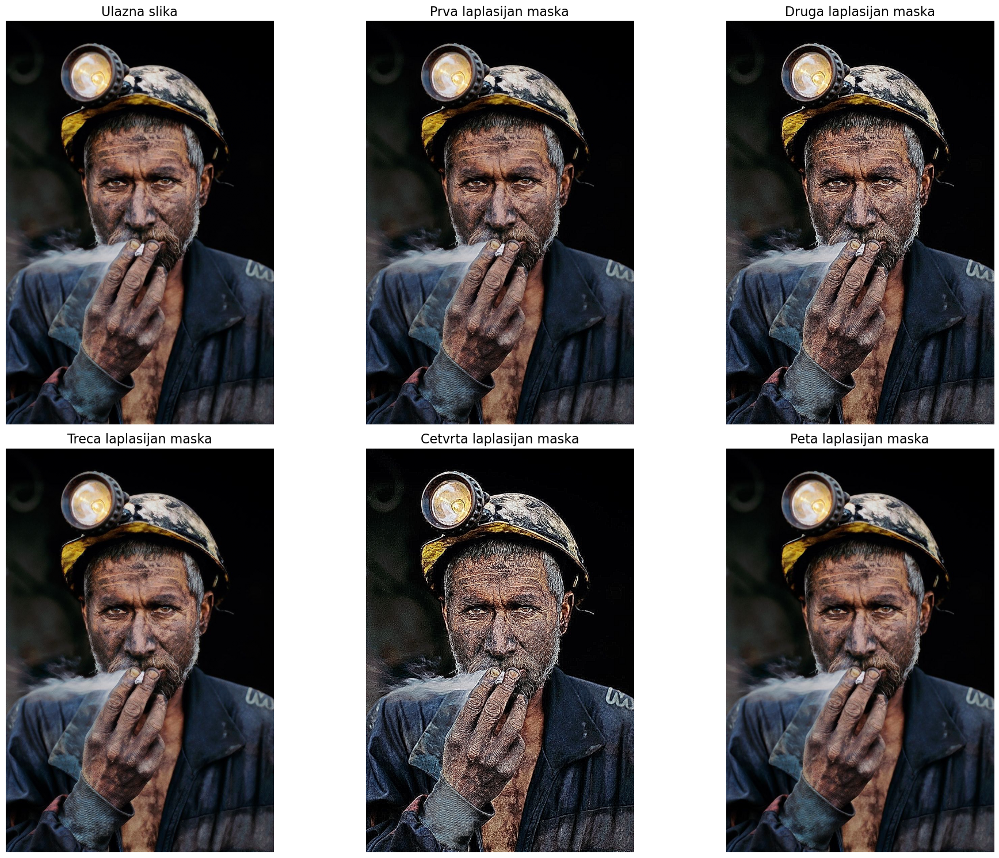

In [14]:
# Pokazivanje zavisnost odabira laplasijana od izlazne slike

def sharp_with_laplacian(image, laplacian_mask):
    '''
    Funkcija koja izostrava sliku sa datom laplasijan maskom
    
    Ulazi:
    - image (numpy.ndarray): predstavlja sliku sa tri komponente boje
    - laplacian_mask (numpu.ndarray): matrica koeficijenata maske
    
    Izlazi: None
    '''
    img_yuv = color.rgb2yuv(image)

    # Korelaciju vrsimo samo nad Y komponentom slike
    img_y = img_yuv[:,:,0]
    img_y_lap = ndimage.correlate(img_y, laplacian_mask) # VF filtirana slika 
    img_y_sharp = img_y - img_y_lap # Znak minus kada je centralni elem. negativan

    img_y_sharp = np.clip(img_y_sharp, 0, 1)
    
    img_yuv_out = np.zeros(shape=shape(img_yuv), dtype=float64)
    img_yuv_out[:,:,1:3] = img_yuv[:,:,1:3]
    img_yuv_out[:,:,0] = img_y_sharp

    img_rgb_out = color.yuv2rgb(img_yuv_out)

    img_rgb_out = np.clip(img_rgb_out, 0, 1)
    
    return img_rgb_out

# Gore navedene maske za laplasijan
laplacian_mask1 = np.array([ [0,  1, 0],
                            [1, -4, 1],
                            [0,  1, 0] ])
laplacian_mask2 = np.array([ [1,  1, 1],
                            [1, -8, 1],
                            [1,  1, 1] ])
laplacian_mask3 = np.array([ [-1, 2, -1],
                            [2, -4, 2],
                            [-1,  2, -1] ]) 

laplacian_mask4 = np.array([ [0,  0, 1, 0, 0],
                            [0, 1, 2, 1, 0],
                            [1, 2, -16, 2, 1],
                            [0, 1, 2, 1, 0],
                            [0,  0, 1, 0, 0]])

laplacian_mask5 = np.array([ [0,  0.0625, 0],
                            [0.0625, -0.25, 0.0625],
                            [0,  0.0625, 0] ]) 

# Izostravamo istu sliku img sa maskama
img_sharp1 = sharp_with_laplacian(img, laplacian_mask1)
img_sharp2 = sharp_with_laplacian(img, laplacian_mask2)
img_sharp3 = sharp_with_laplacian(img, laplacian_mask3)
img_sharp4 = sharp_with_laplacian(img, laplacian_mask4)
img_sharp5 = sharp_with_laplacian(img, laplacian_mask5)

# Prikaz rezultata
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(20,15), dpi=100)

ax[0,0].imshow(img); ax[0,0].set_axis_off(); ax[0,0].set_title('Ulazna slika', fontsize=16)
ax[0,1].imshow(img_sharp1); ax[0,1].set_axis_off(); ax[0,1].set_title('Prva laplasijan maska', fontsize=16)
ax[0,2].imshow(img_sharp2); ax[0,2].set_axis_off(); ax[0,2].set_title('Druga laplasijan maska', fontsize=16)
ax[1,0].imshow(img_sharp3); ax[1,0].set_axis_off(); ax[1,0].set_title('Treca laplasijan maska', fontsize=16)
ax[1,1].imshow(img_sharp4); ax[1,1].set_axis_off(); ax[1,1].set_title('Cetvrta laplasijan maska', fontsize=16)
ax[1,2].imshow(img_sharp5); ax[1,2].set_axis_off(); ax[1,2].set_title('Peta laplasijan maska', fontsize=16)

plt.tight_layout();


Na primeru pete slike se najbolje vidi pojačan šum. To znači da ta maska u frekvencijskom domenu najviše pojačava više učestanosti. Treća slika je ista kao dobijena u prethodnoj ćeliji. Rezultati druge, četvrte i poslednje slike imaju dovoljno izoštrene ivice, a šum nije previše pojačan. Smatramo ih kao kandidatima za čuvanje kao rezultat. 

## 2.2. Isticanje visokih ucestanosti

Ova metoda za izoštravanje slike koristi osobinu prostornog usrednjavanja. Naime, nakon prostornog usrednjavanja slike, ivice slike degradiraju, a šum se smanjuje. To je zato što u frekvencijskom domenu ova operacija zapravo predstavlja filtriranje sa propusnikom niskih učestanosti (LP filtar). 

Ako sliku koja je dobijena LP filtrom oduzmemo od originalne, dobijamo sliku sa visokim učestanostima (kao da smo je propustili kroz HP filtar). Možemo zatim da ovu HP sliku dodamo (sa koeficijentom) orginalnoj slici. Tako smo pojačali (istakli) visoke učestanosti. U ovom našem kodu radimo ekvivalentno, pomoću parametara $\alpha$ i $\beta$, tj. vršimo transformaciju:

$g[x,y]=\alpha\cdot\delta[x,y]*f[x,y]-\beta\cdot\omega_{LP}[x,y]*f[x,y]$

Parametre alfa i beta treba birati tako da ekvivalentna maska ima sumu elemenata jedan, da se ne bi promenila osvetljenost slike.

Ovu transformaciju ćemo vršiti samo nad sivom slikom, ne nad sve tri komponente boja, kao što je specificirano u tekstu zadatka.

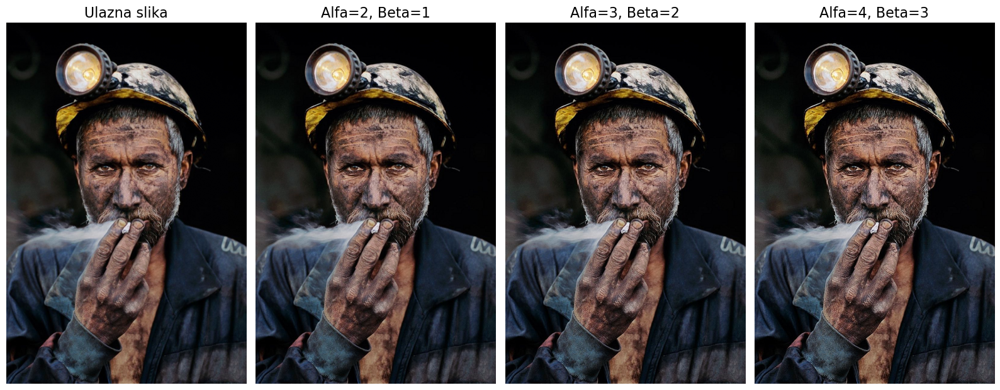

In [15]:
def sharpen_HF(image, alfa, beta):
    '''
    Funkcija koja izostrava sliku isticanjem visokih ucestanosti
    
    Ulazi:
    - image (numpy.ndarray): ulazna slika sa tri komponente boje
    - alfa (float): parametar za isticanje ucestanosti
    - beta (float): parametar za isticanje ucestanosti
    
    Izlazi: None
    '''
    img_rgb = image

    img_yuv = color.rgb2yuv(img_rgb)
    img_y = img_yuv[:,:,0]

    lowpass_mask = np.ones(shape=(3,3))/9
    img_y_blurred = ndimage.correlate(img_y, lowpass_mask)
    # img_y_details = img_y - img_y_blurred

    # img_y_sharp = img_y + 2*img_y_details

    img_y_sharp = alfa * img_y - beta * img_y_blurred

    img_yuv_out = np.zeros(shape(img_yuv))
    img_yuv_out[:,:,1:3] = img_yuv[:,:,1:3]
    img_yuv_out[:,:,0] = img_y_sharp

    img_rgb_out = color.yuv2rgb(img_yuv_out)

    img_rgb_out = np.clip(img_rgb_out, 0, 1)
    return img_rgb_out

# Izostavanje sa tri seta parametara alfa i beta
img_sharpen1 = sharpen_HF(img, 2,1)
img_sharpen2 = sharpen_HF(img, 3,2)
img_sharpen3 = sharpen_HF(img, 4,3)

# Prikazivanje rezultata
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(16,8), dpi=100)
ax = axes.ravel()

ax[0].imshow(img); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika', fontsize=16)
ax[1].imshow(img_sharpen1); ax[1].set_axis_off(); ax[1].set_title('Alfa=2, Beta=1', fontsize=16)
ax[2].imshow(img_sharpen2); ax[2].set_axis_off(); ax[2].set_title('Alfa=3, Beta=2', fontsize=16)
ax[3].imshow(img_sharpen3); ax[3].set_axis_off(); ax[3].set_title('Alfa=4, Beta=3', fontsize=16)

plt.tight_layout();

Sa večim parametrima alfa i beta bi se dobio pojačan šum i izoštrenije ivice. Smanjenjem parametara se dobija slika bliža početnoj. Na primer, izbor $\alpha=1, \beta=0$ bi dao originalnu sliku (videti izraz iznad). 

## 2.3 Zakljucak

Mislim da je izoštravanje isticanjem učestanosti imalo bolje rezultate nego primenom laplasijana. Pre svega, jer je lakši odabir parametara. Da ne bismo prenaglasili šum primenom laplasijana, moramo koristiti laplasijan maske koje imaju vrlo male koeficijente (videti petu masku). Za razliku od toga, sa parametrima alfa i beta u drugoj metodi nismo morali tako male razlike u koeficijentima da pravimo i imamo dosta manje koeficijenata. 

Najbolje izoštrena slika sa najmanje istaknutim šumom je, po mom mišljenju, dobijena sa odabirom parametara $\alpha=3, \beta=2$. Tu sliku ćemo sačuvati

In [16]:
# Cuvanje slike
img_out = util.img_as_ubyte(img_sharpen2) 
output_image_path = os.path.join(data_dir, 'miner_sharp.jpg')
io.imsave(output_image_path, img_out)

# Zadatak 3 (Implementacija CLAHE metode)

CLAHE metodu smo videli u prvom zadatku. Tada smo objasnili ukratko kako ona radi (regioni slike, klipovanje histograma). Da bismo je realizovali, objasnićemo detaljnije postupak u narednoj ćeliji.

In [17]:
# Import-ovanje potrebnih biblioteka
import matplotlib.pyplot as plt

import skimage
from skimage import color
from skimage import exposure
from skimage import filters
from skimage import io
from skimage import util

import numpy as np
from math import floor, ceil

import os

ImageProperties:
   type:    <class 'numpy.ndarray'>
   element type:    <class 'numpy.uint8'>
   size:    1445850
   shape:    (567, 850, 3)
   min:    0
   max:    255
   mean:    37.10010582010582


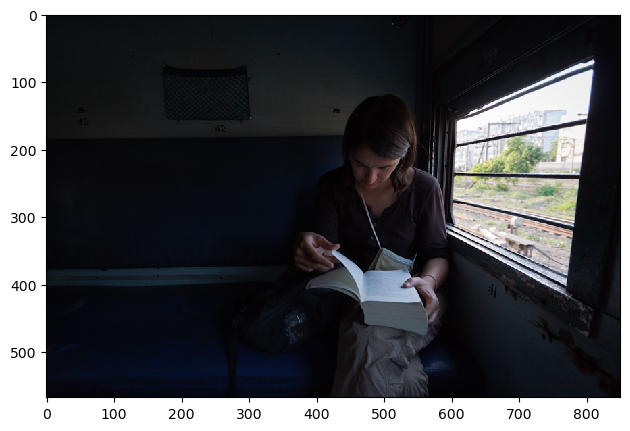

In [18]:
# Ucitavanje slike train.jpg
data_dir = '../sekvence'
image_path = os.path.join(data_dir, 'train.jpg')
img = io.imread(image_path)
printImageProperties(img)
io.imshow(img)

## 3.1. Realizacija dosCLAHE funkcije

**Objašnjenje postupka**

Imaćemo nekoliko pomoćnih funkcija. Prvo proveravamo validnost unetih parametara funkcije. Ukoliko je neki neadekvatan, ispisujemo na standardni izlaz koja je greška. Ukoliko su svi parametri validni, zatim gledamo da li je uneta slika u boji ili siva slika. Ukoliko je uneta siva slika, samo nad njom vrsimo CLAHE, u suprtnom, ako je uneta slika u boji, pretvaramo je u HSV kolor sistem i vršimo CLAHE nad V komponentom.

**Napomena**: Čitajući dokumentaciju za ugrađenu funkciju exposure.equalize_adapthist(...), u njoj se CLAHE vrši samo nad V komponentom slike. Ovo dosta štedi na vremenu, jer se ceo postupak sa histogramima po regionima vrši samo jedanput, a ne triput. Inspirisan time sam i ja tako realizovao metodu.

Postupak nad sivom slikom radimo u sledećim koracima:
1. dopunjujemo sliku da bude umnožak NxM
2. nad svakim regionom slike vršimo CLHE i rezultate čuvamo u posebnoj promenljivoj, koju u kodu nazivam bafer
3. za svaki piksel na osnovu bafera određujemo:
    - parametre a, b, c, d
    - koji je za njega gornji-levi region (u pdf-u poslatom uz domaći je on obeležen sa P)
    - vrednosti transformacija T1, T2, T3, T4 za regione koje okružuju piksel, pri čemu T1 odgovara transformaciji u gornje-levom regionu
    - na osnovu svih gornjih parametara određujemo novi intenzitet piksela i upisujemo ga u izlaznu sliku
    
**Napomena**: Parametre za bilinearnu transformaciju sam nalazio malo drugačije nego u pdfu koji nam je poslat uz domaći. Dovoljno je da čuvamo indekse (i,j) za gornji levi region nego da čuvamo sva četiri regiona. Ukoliko su vrednosti za njegove indekse -1 ili N-1(M-1), to znači da smo na ivici slike i primenjujemo pravilo iz tog pdf-a za ivice. Parametre a, b, c, d možemo direktno dobiti od vrednosti x, y, N, M, gde su (x,y) koordinate piksela, a N i M broj regiona po vertikali i horizontali. 

U nastavku sledi gore opisan postupak izdeljen u više funkcija.

In [19]:
# Vraca se slika koja je dopunjena tako da je umnozak N i M
def dopunaSlike(imgIn, N, M):
    '''
    Dopunnjuje sliku za potrebe deljenja u regione NxM
    
    Ulazi:
    - imgIn (numpy.ndarray): ulazna siva (2D) slika
    - N, M (int): broj regiona slike po vertikali, odnosno horizontali
    
    Izlazi:
    - imgOut (numpu.ndarray): dopunjena slika sa ponovljenim padding-om takva da su dimenzije umnosci N i M
    '''
    
    # Dimenzije slike
    h, w = imgIn.shape
    if(h % N != 0):
        # Pravimo repeat_array niz u formatu [x,1,1,...,y]
        # Moramo dopuniti sliku za N-(h%N) redova
        # polovinu gore, polovinu dole
        padding_above = N-(h%N)
        padding_above = padding_above//2
        padding_below = N-(h%N)-padding_above
        repeat_array = np.ones(h, dtype=int)
        repeat_array[0] = repeat_array[0]+padding_above
        repeat_array[-1] = repeat_array[-1]+padding_below
        
        # Koriscenjem repeat_array, dopunimo sliku po x osi
        imgIn = np.repeat(imgIn, repeats = repeat_array, axis=0)
        
    if(w % M != 0):
        # Analogno pravimo repeat_array niz za drugu dimenziju
        padding_left = M-(w%M)
        padding_left = padding_left//2
        padding_right  = M-(w%M)-padding_left
        repeat_array = np.ones(w, dtype=int)
        repeat_array[0] = repeat_array[0]+padding_left
        repeat_array[-1] = repeat_array[-1]+padding_right
        
        # Koriscenjem repeat_array, dopunimo sliku po y osi
        imgIn = np.repeat(imgIn, repeats = repeat_array, axis=1)

    return imgIn

In [20]:
from math import floor

# Vraca se bafer, struktura podataka koja cuva ekvalizacije po regionima
def ekvalizacija_po_regionima(imgIn, N, M, limit):
    '''
    Funkcija koja vrsi CLHE po regionima slike i vraca rezultate u jednom nizu
    
    Ulazi:
    - imgIn (numpy.ndarray): ulazna 2D slika
    - N, M (int): broj regiona slike po vertikali, odnosno horizontali
    - limit (float): ClipLimit primenjen u CLHE metodi
    
    Izlaz:
    - bafer (numpy.ndarray): Niz NxMx256 koji cuva transformacije T(r) po regionima
    '''
    
    # Za svaki region slike vrsimo ekvalizaciju histograma
    # Rezultate svih ekvalizacija smestamo u bafer
    bafer = np.zeros(shape=(N,M,256), dtype=float)
    region_height = imgIn.shape[0]/N
    region_width = imgIn.shape[1]/M
    
    # Za svaki piksel u slici, dodajemo ga u bafer
    for x in range(imgIn.shape[0]):
        for y in range(imgIn.shape[1]):
            # piksel sa koord (x,y) se nalazi u regionu (i,j)
            i = int(floor(x/region_height))
            j = int(floor(y/region_width))
            intenzitet_piksela = int(imgIn[x,y])
            bafer[i, j, intenzitet_piksela] = bafer[i, j, intenzitet_piksela] + 1
    
    bafer = bafer/(region_height*region_width)
    
    # Klipovanje histograma i kreiranje fja T(r) za sve regione
    for i in range(N):
        for j in range(M):
            # Koraci za jedan histogram bafer[i, j, :]:
            # 1. sve elemente histograma vece od limit klipujemo
            # 2. sve klipovane vrednosti cuvamo u sumi koju posle redistribuiramo kroz niz
            # 3. od dobijenog klipovanog histograma kreiramo kumulativnu fju raspodele
            suma = 0
            for k in range(256):
                if(bafer[i,j,k]>limit):
                    suma = suma + bafer[i,j,k]-limit
                    bafer[i,j,k]=limit

            # Sumu redistribuiramo po nizu
            sabirak = suma/256
            bafer[i,j,:]=bafer[i,j,:]+sabirak
            
            # Od histograma do kumulativne fje raspodele
            bafer[i,j,:]= np.cumsum(bafer[i,j,:])
    
    # fiksna vrednost zato sto znamo da je slika u uint8 formatu
    L = 256      
    bafer = bafer*(L-1) 

    return bafer

In [21]:
def generisanje_nove_slike(imgIn, bafer, N, M):
    '''
    Vrsi CLAHE nad ulaznom slikom sa datim transformacijama T(r)
    
    Ulazi:
    - imgIn (numpy.ndarray): ulazna 2D slika
    - bafer (numpy.ndarray): Niz NxMx256 u kom cuvamo T(r) za svaki region slike
    - N, M (int): broj regiona slike po vertikali, odnosno horizontali
    
    Izlazi:
    - imgOut (numpy.ndarray): slika dobijena od imgIn primenom CLAHE
    '''
    imgOut = np.zeros(imgIn.shape, dtype = np.uint8)
    
    # Dimenzije jednog regiona slike
    region_height = imgIn.shape[0]/N
    region_width = imgIn.shape[1]/M
    
    # Za svaki piksel u slici sada odredjujemo novi intenzitet
    for x in range(imgIn.shape[0]):
        for y in range(imgIn.shape[1]):
            # piksel sa koord (x,y) se nalazi u regionu (i,j)
            i = int(floor(x/region_height))
            j = int(floor(y/region_width))
            intenzitet_piksela = int(imgIn[x,y])
            
            # Postupak:
            # 1. odredimo parametre a, b, c i d
            # 2. odredimo region koji koristimo za racunanje T1 i cuvamo njegove koordinate (p_i, p_j)
            # Napomena: objasnjenja o nalazenju parametara se nalazi u pdf-u
            # 3. Na osnovu parametara odredimo s - novi intenzitet piksela 
            
            # Nalazenje parametara a, b, c i d 
            c = x + ceil(region_height/2)
            a = y + ceil(region_width/2)
            c = c % region_height
            a = a % region_width
            if(region_height%2==0):
                c=c+0.5
            if(region_width%2==0):
                a=a+0.5
            b = region_width - a
            d = region_height - c
            
            # Nalazenje gornje-levog regiona, (i, j)- region kome pripada ovaj piksel
            if(a>=region_width/2):
                if(c>=region_height/2):
                    p_i = i-1
                    p_j = j-1
                else:
                    p_i = i
                    p_j = j-1
            else:
                if(c>=region_height/2):
                    p_i = i-1
                    p_j = j
                else:
                    p_i = i
                    p_j = j
            
            # Racunanje novog intenziteta piksela
            T1 = 0
            if(p_i >= 0 and p_j >= 0):
                T1 = bafer[p_i, p_j, intenzitet_piksela]            
            T2 = 0
            if(p_i >= 0 and p_j + 1 <= M-1):
                T2 = bafer[p_i, p_j + 1, intenzitet_piksela]
            T3 = 0
            if(p_i + 1 <= N-1 and p_j >= 0):
                T3 = bafer[p_i + 1, p_j, intenzitet_piksela]
            T4 = 0
            if(p_i + 1 <= N-1 and p_j + 1 <= M-1):
                T4 = bafer[p_i + 1, p_j + 1, intenzitet_piksela]
                
            sh1 = (b*T1+a*T2)/(a+b)
            sh2 = (b*T3+a*T4)/(a+b)
            s = (d*sh1+c*sh2)/(c+d)

            imgOut[x,y]=s
            
    return imgOut

In [22]:
def CLAHE(imgIn, numTiles, limit):
    '''
    Vrsi CLAHE nad ulaznom slikom sa datim brojem regiona i CLipLimit-om
    
    Ulazi:
    - imgIn (numpy.ndarray): ulazna 2D slika
    - numTiles (list): Lista u formatu [N, M], predstavlja broj regiona slike po vertikali, odnosno horizontali
    - limit (float): ClipLimit primenjen u CLHE metodi
    
    Izlazi:
    - imgOut (numpy.ndarray): slika dobijena od imgIn primenom CLAHE
    '''
    # dimenzije originalne slike
    h, w = imgIn.shape 
    # broj blokova po hor i po vertikali slike
    N, M = numTiles 
    
    # Dopuna slike da bude umnozak NxM
    imgIn = dopunaSlike(imgIn, N, M)

    # Bafer je struktura podataka u kojoj cuvamo adaptivne ekvalizacije histograma po regionima
    bafer = ekvalizacija_po_regionima(imgIn, N, M, limit)
    
    # Generisanje nove slike na osnovu bafera
    imgOut = generisanje_nove_slike(imgIn, bafer, N, M)
    
    # Izdvajanje slike sirine hxw
    padding_above=0
    if(h%N!=0):
        padding_above = (N-(h%N))//2
    padding_left = 0
    if(w%M!=0):
        padding_left = (M-(w%M))//2
    imgOut = imgOut[padding_above:padding_above+h, padding_left:padding_left + w]
    
    return imgOut

In [23]:
def dosCLAHE(imgIn, numTiles = [8, 8], limit = 0.01):
    '''
    Vrši CLAHE metodu nad ulaznom slikom
    
    Ulazi:
    - imgIn (numpy.ndarray): predstavlja ulaznu sliku (sivu ili u boji)
    - numTiles (list): Lista u formatu [N, M], predstavlja broj regiona slike po vertikali, odnosno horizontali
    - limit (float): ClipLimit primenjen u CLHE metodi
    
    Izlazi:
    - imgOut (numpy.ndarray): slika dobijena od imgIn primenom CLAHE
    '''
    
    # Provera validnosti unetih parametara
    if(type(numTiles)!=list):
        print("Greška! Niste uneli niz za dimenzije regiona.")
        return
    if(len(numTiles)!=2):
        print("Greška! Niste uneli niz od 2 broja za dimenzije regiona.")
        return
    if(not isinstance(numTiles[0], int) or not isinstance(numTiles[1], int)):
        print("Greška! Niste uneli brojeve za dimenziju regiona.")
        return
    if(numTiles[0]<1 or numTiles[1]<1):
        print("Greška! Niste uneli korektne dimenzije za region.")
        return
    if(type(imgIn) != np.ndarray):
        print("Greška! Niste uneli sliku, već nešto levo.")
        return
    if((imgIn.ndim==2 and type(imgIn[0,0])!=np.uint8) or (imgIn.ndim==3 and type(imgIn[0,0,0])!=np.uint8)):
        print("Greška! Niste uneli sliku uint8 formata.")
        return
    if(not isinstance(limit, float)):
        print("Greška! Niste uneli korektan clipLimit parametar.")
        return
    if(limit<0):
        print("Greška! Niste uneli korektan clipLimit parametar.")
        return
    
    # Ukoliko je slika siva, samo nad njom vrsimo CLAHE
    # Ukoliko je slika u boji, vrsimo CLAHE nad V komponentom (HSV kolor sistem)
    if(imgIn.ndim==2):
        imgOut = CLAHE(imgIn, numTiles, limit)
    elif(imgIn.ndim==3):
        # Konverzija RGB u HSV
        imgIn_hsv = util.img_as_ubyte(color.rgb2hsv(imgIn))
        
        # CLAHE primenjujemo samo nad V kanalom
        imgIn_v = imgIn_hsv[:,:,2]
        imgIn_v_clahe = CLAHE(imgIn_v, numTiles, limit)
        
        # Vracamo nazad V komponentu
        imgOut_hsv = imgIn_hsv.copy()
        imgOut_hsv[:,:,2] = imgIn_v_clahe
        imgOut = util.img_as_ubyte(color.hsv2rgb(imgOut_hsv))
    else:
        print("Greška! Niste uneli sliku, već nešto levo.")
        return 
        
    return imgOut
# io.imshow(dosCLAHE(img))

## 3.2. Uticaj parametara na popravku kvaliteta slike

Variranjem parametara N, M i Cliplimit značajno utičemo na izlaznu sliku. 

Ukoliko imamo puno **regiona slike**, onda će se detalji u slici zamutiti, dok ako imamo malo regiona, određeni regioni će potencijalno postati previše svetli ili tamni (isti problem kao kod obične HE metode). 

**Cliplimit parametar** utiče na prenaglašavanje kontrasta, tj. ukoliko je veliki taj parametar, regioni slike će imati istovremeno i vrlo tamne i vrlo svetle delove. Na primeru poslednje slike, možemo primetiti, ako izdvojimo neki region na zidu, da se javljaju i velika i mala osvetljenja, iako tako ne bi trebalo da izgleda zid u vozu. Mali parametar limit će obezbediti da histogram u svakom regionu slike bude uniforman najviše moguće. 

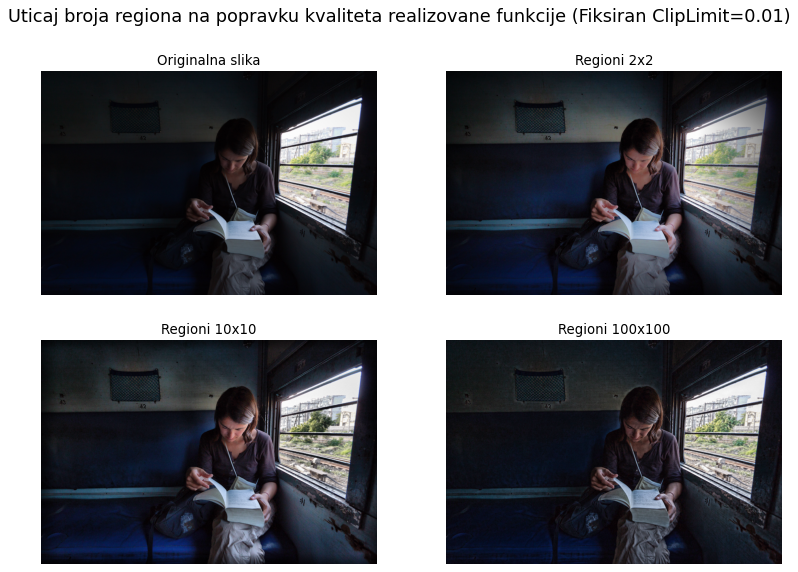

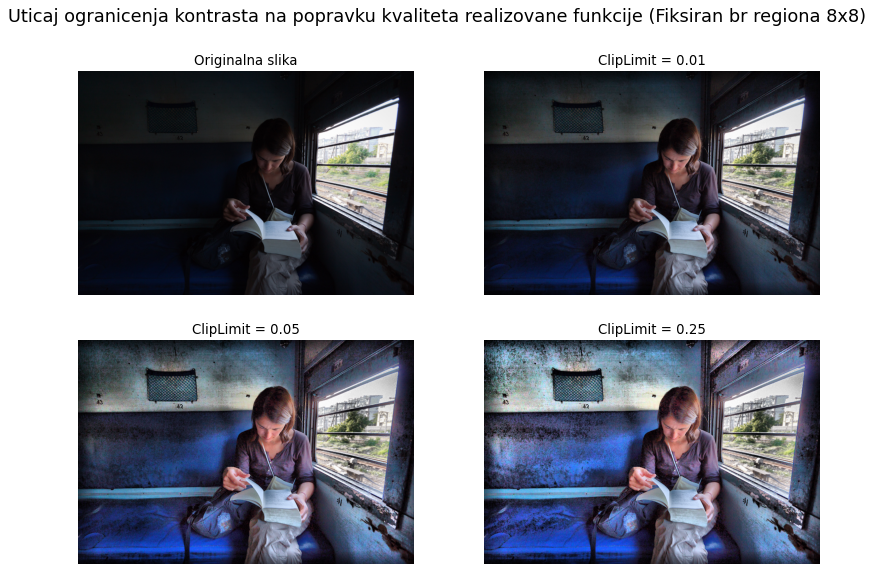

In [24]:
# Uticaj parametra N i M
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12,8), dpi=80)
fig.suptitle('Uticaj broja regiona na popravku kvaliteta realizovane funkcije (Fiksiran ClipLimit=0.01)', fontsize=16)

ax[0,0].imshow(img); 
ax[0,0].set_title('Originalna slika'); 
ax[0,0].axis('off')

imgOut1 = dosCLAHE(img, [2, 2])
ax[0,1].imshow(imgOut1); 
ax[0,1].set_title('Regioni 2x2'); 
ax[0,1].axis('off')

imgOut2 = dosCLAHE(img, [10, 10])
ax[1,0].imshow(imgOut2); 
ax[1,0].set_title('Regioni 10x10'); 
ax[1,0].axis('off');

imgOut3 = dosCLAHE(img, [100, 100])
ax[1,1].imshow(imgOut3); 
ax[1,1].set_title('Regioni 100x100'); 
ax[1,1].axis('off');


# Uticaj parametra clipLimit
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12, 8), dpi=80)
fig.suptitle('Uticaj ogranicenja kontrasta na popravku kvaliteta realizovane funkcije (Fiksiran br regiona 8x8)', fontsize = 16)

ax[0,0].imshow(img); 
ax[0,0].set_title('Originalna slika'); 
ax[0,0].axis('off')

imgOut1 = dosCLAHE(img, [8, 8], 0.01)
ax[0,1].imshow(imgOut1); 
ax[0,1].set_title('ClipLimit = 0.01'); 
ax[0,1].axis('off')

imgOut2 = dosCLAHE(img, [8, 8], 0.05)
ax[1,0].imshow(imgOut2); 
ax[1,0].set_title('ClipLimit = 0.05'); 
ax[1,0].axis('off');

imgOut3 = dosCLAHE(img, [8, 8], 0.25)
ax[1,1].imshow(imgOut3); 
ax[1,1].set_title('ClipLimit = 0.25'); 
ax[1,1].axis('off');

## 3.3. Poredjenje sa ugradjenom funkciom skimage.exposure.equalize_adapthist()

Da bismo uporedili našu realizovanu funkciju i ugrađenu, prikazaćemo iste prethodne grafike ali sada koristeći ugrađenu funkciju. Menjanjem parametara, primećujemo da se ugrađena funkcija nepredvidivo ponaša sa male vrednosti broja regiona po osama i za velike vrednosti cliplimit-a. U takvim slučajevima nećemo vršiti poređenja sa funkcijom dosCLAHE. 

Primećujemo da se funkcije slično ponašaju (videti objašnjenje na početku prethodnog segmenta). Izuzeci su samo ti neočekivani slučajevi (kada je N,M<5 ili cliplimit>0.2). Tada se ugrađena funkcija verovatno ponaša drugačije zbog načina kako je realizovana.

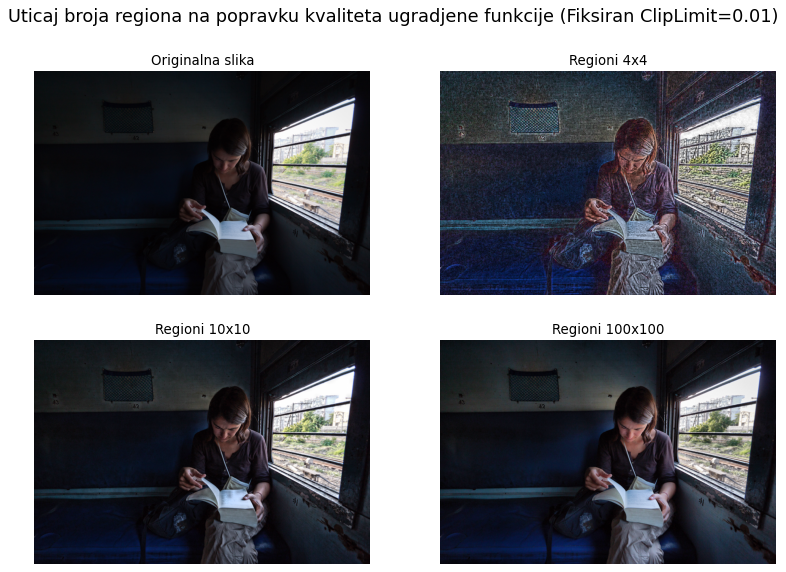

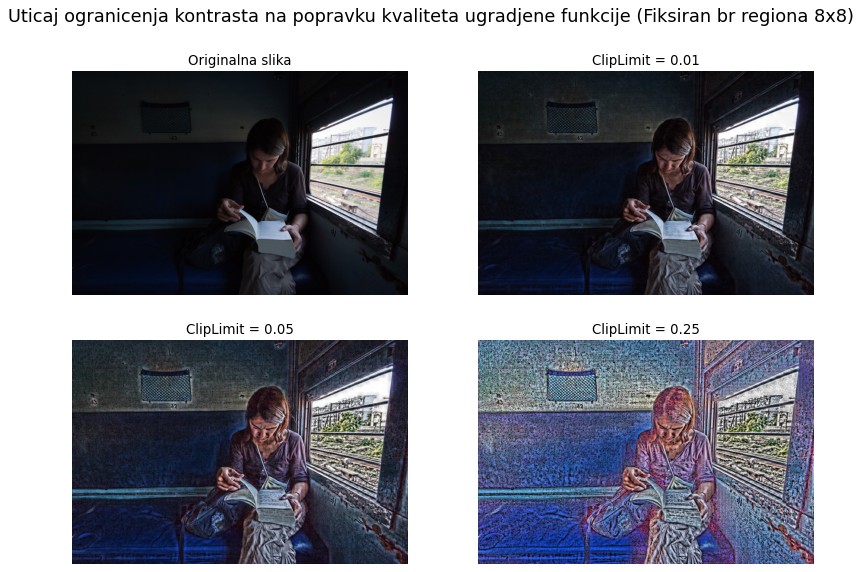

In [25]:
# Uticaj parametra N i M
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12,8), dpi=80)
fig.suptitle('Uticaj broja regiona na popravku kvaliteta ugradjene funkcije (Fiksiran ClipLimit=0.01)', fontsize=16)

ax[0,0].imshow(img); 
ax[0,0].set_title('Originalna slika'); 
ax[0,0].axis('off')

imgOut1 = exposure.equalize_adapthist(img, [4, 4])
ax[0,1].imshow(imgOut1); 
ax[0,1].set_title('Regioni 4x4'); 
ax[0,1].axis('off')

imgOut2 = exposure.equalize_adapthist(img, [10, 10])
ax[1,0].imshow(imgOut2); 
ax[1,0].set_title('Regioni 10x10'); 
ax[1,0].axis('off');

imgOut3 = exposure.equalize_adapthist(img, [100, 100])
ax[1,1].imshow(imgOut3); 
ax[1,1].set_title('Regioni 100x100'); 
ax[1,1].axis('off');


# Uticaj parametra clipLimit
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12, 8), dpi=80)
fig.suptitle('Uticaj ogranicenja kontrasta na popravku kvaliteta ugradjene funkcije (Fiksiran br regiona 8x8)', fontsize = 16)

ax[0,0].imshow(img); 
ax[0,0].set_title('Originalna slika'); 
ax[0,0].axis('off')

imgOut1 = exposure.equalize_adapthist(img, [8, 8], 0.01)
ax[0,1].imshow(imgOut1); 
ax[0,1].set_title('ClipLimit = 0.01'); 
ax[0,1].axis('off')

imgOut2 = exposure.equalize_adapthist(img, [8, 8], 0.05)
ax[1,0].imshow(imgOut2); 
ax[1,0].set_title('ClipLimit = 0.05'); 
ax[1,0].axis('off');

imgOut3 = exposure.equalize_adapthist(img, [8, 8], 0.25)
ax[1,1].imshow(imgOut3); 
ax[1,1].set_title('ClipLimit = 0.25'); 
ax[1,1].axis('off');

## 3.4. Vreme izvrsavanja

Potrebno je da uporedimo vremena izvršavanja naše i ugrađene funkcije. To ćemo postići za vrednosti parametara navedenim u tekstu zadatka. Na kraju ćemo prikazati normalizovana vremena izvršavanja u sekundama po pikselu.

In [26]:
import time

# Vrednosti koriscene za merenje vremena funkcije
limit_values = [0.0, 0.01, 0.1, 1.0]
numTiles_values = [1, 4, 8, 16]

# Merenje realizovane funkcije dosCLAHE
print('Merenje vremena za dosCLAHE:')
times = np.zeros(shape=(4,4,2))
i = j = 0
for num in numTiles_values:
    for limit in limit_values:
        print(f'Num={num}, limit={limit}')
        start = time.time()
        imgOut = dosCLAHE(img, [num, num], limit)
        end = time.time()
        execution_time = end-start
        # print(f'Vreme izvrsavanja: {round(execution_time, 3)}s')
        execution_time_norm = execution_time/np.size(img)
        # print(f'Normalizovano vreme izvrsavanja: {round(execution_time_norm*1e6, 3)}us/pix')
        # print("")
        times[i,j,0]=execution_time
        times[i,j,1]=execution_time_norm
        j=j+1
    i=i+1
    j=0

print("Izmerena vremena za realizovanu funkciju dosCLAHE.")
    
# Merenje ugradjene fje
print("Merenje vremena za ugradjenu funkciju:")
times_builtin = np.zeros(shape=(4,4,2))
i = j = 0
for num in numTiles_values:
    for limit in limit_values:
        print(f'Num={num}, limit={limit}')
        start = time.time()
        imgOut = exposure.equalize_adapthist(img, [img.shape[0]/num, img.shape[1]/num], limit)
        end = time.time()
        execution_time = end-start
        # print(f'Vreme izvrsavanja: {round(execution_time, 3)}s')
        execution_time_norm = execution_time/np.size(img)
        # print(f'Normalizovano vreme izvrsavanja: {round(execution_time_norm*1e6, 3)}us/pix')
        # print("")
        times_builtin[i,j,0]=execution_time
        times_builtin[i,j,1]=execution_time_norm
        j=j+1
    i=i+1
    j=0
    
print("Izmerena vremena za ugradjenu funkciju.")

Merenje vremena za dosCLAHE:
Num=1, limit=0.0
Num=1, limit=0.01
Num=1, limit=0.1
Num=1, limit=1.0
Num=4, limit=0.0
Num=4, limit=0.01
Num=4, limit=0.1
Num=4, limit=1.0
Num=8, limit=0.0
Num=8, limit=0.01
Num=8, limit=0.1
Num=8, limit=1.0
Num=16, limit=0.0
Num=16, limit=0.01
Num=16, limit=0.1
Num=16, limit=1.0
Izmerena vremena za realizovanu funkciju dosCLAHE.
Merenje vremena za ugradjenu funkciju:
Num=1, limit=0.0
Num=1, limit=0.01
Num=1, limit=0.1
Num=1, limit=1.0
Num=4, limit=0.0
Num=4, limit=0.01
Num=4, limit=0.1
Num=4, limit=1.0
Num=8, limit=0.0
Num=8, limit=0.01
Num=8, limit=0.1
Num=8, limit=1.0
Num=16, limit=0.0
Num=16, limit=0.01
Num=16, limit=0.1
Num=16, limit=1.0
Izmerena vremena za ugradjenu funkciju.


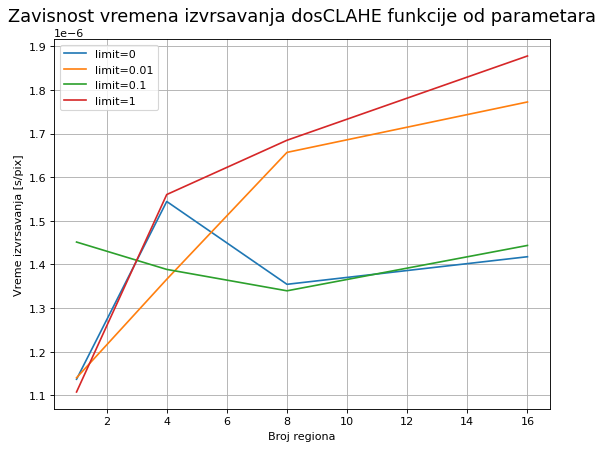

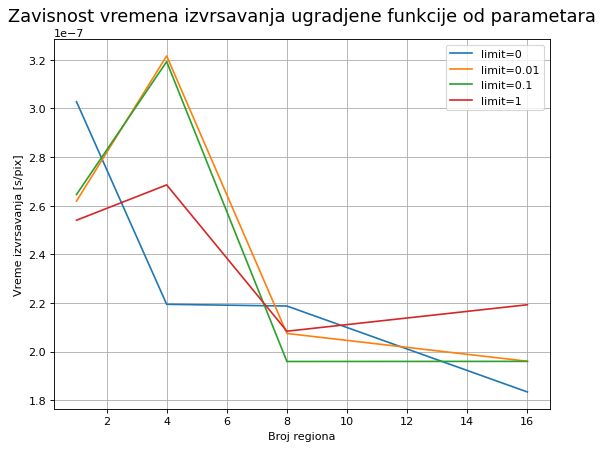

In [27]:
plt.figure(figsize=(8, 6), dpi=80)
plt.title('Zavisnost vremena izvrsavanja dosCLAHE funkcije od parametara', fontsize = 16)

plt.plot(numTiles_values, times[:,0,1], label='limit=0')
plt.plot(numTiles_values, times[:,1,1], label='limit=0.01')
plt.plot(numTiles_values, times[:,2,1], label='limit=0.1')
plt.plot(numTiles_values, times[:,3,1], label='limit=1')


plt.grid(visible=True)
plt.legend()
plt.xlabel('Broj regiona')
plt.ylabel('Vreme izvrsavanja [s/pix]')
plt.show()

plt.figure(figsize=(8, 6), dpi=80)
plt.title('Zavisnost vremena izvrsavanja ugradjene funkcije od parametara', fontsize = 16)

plt.plot(numTiles_values, times_builtin[:,0,1], label='limit=0')
plt.plot(numTiles_values, times_builtin[:,1,1], label='limit=0.01')
plt.plot(numTiles_values, times_builtin[:,2,1], label='limit=0.1')
plt.plot(numTiles_values, times_builtin[:,3,1], label='limit=1')


plt.grid(visible=True)
plt.legend()
plt.xlabel('Broj regiona')
plt.ylabel('Vreme izvrsavanja [s/pix]')
plt.show()

**Komentar**: 

Naša metoda postaje sporija sa povećanjem broja regiona slike. Ovo ima smisla, jer se time povećava vreme za izračunavanje bafer strukture sa nizovima histograma. Ugrađena funkcija verovatno koristi neke optimizovane metode za čuvanje manje promnljivih ili na potpuno drugačiji način preračunava histograme po regionima.

Na našu metodu, parametar limit ne utiče na vreme izvršavanja, dok se u ugrađenoj funkciji čini kao da se smanjuje vreme izvršavanja sa povećanjem limit-a. Možda je ovo slučajnost, jer smo samo za četiri vrednosti izvršili, pa bismo morali da izvršimo sa još puno vrednosti parametra limit da bismo videli da li ovaj parametar ikako utiče na vreme izvršavanja.

**Napomena**: Grafici će izgledati drugačije svaki put, jer se vremena mere u ćeliji za 2 iznad
